### Notebook for Figure 5 and relevant data, SCeptre analysis of the bulk dataset.

In [1]:
%matplotlib inline
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
import scanpy as sc
import sceptre as spt

## Preparation
Create meta data table and load files into python as "dataset". Alternatively, a meta data table could be created manually and be provided to the function: sceptre.load_dataset()
Mapping is performed with the "File ID" and "Channel" columns.

In [2]:
# create result folder
res_dir = '../results/bulk/'
if not os.path.exists(res_dir):
    os.makedirs(res_dir)

In [3]:
spt.create_meta_data("../data/bulk/", res_dir)

In [4]:
dataset = spt.load_dataset(proteins = "../data/bulk/bulk_Proteins.txt",
                           psms = "../data/bulk/bulk_PSMs.txt",
                           msms = "../data/bulk/bulk_MSMSSpectrumInfo.txt",
                           files = "../data/bulk/bulk_InputFiles.txt",
                           meta = res_dir + "meta.txt")

In [5]:
# mark and remove potential contaminants
contaminants = pd.read_table('../data/contaminants.txt')['Accession']
dataset['proteins']['contaminant'] = dataset['proteins']['Accession'].isin(contaminants)
dataset['proteins'] = dataset['proteins'][dataset['proteins']['contaminant']==False]

In [6]:
figwd = 7.2 # standard figwidth

## LC-MS QC
Plot various visualizations that inform about the quality of each LC-MS run

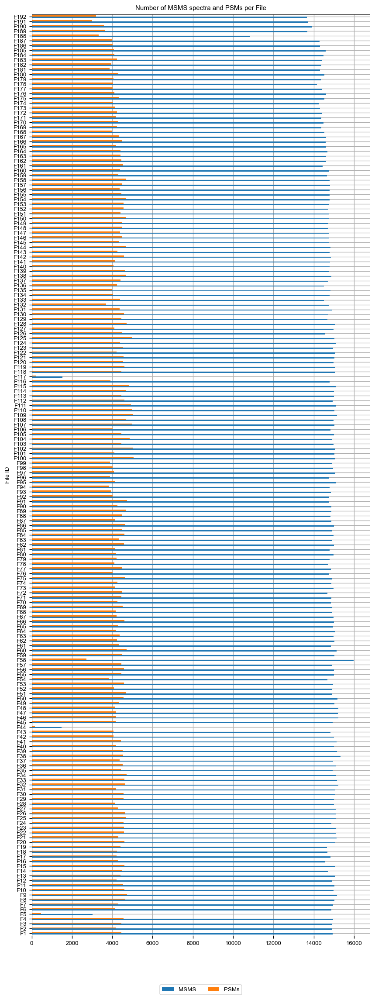

In [7]:
spt.plot_psms_msms(dataset, figsize=(figwd, 18))
plt.savefig(res_dir + "psms_msms.pdf", bbox_inches='tight', transparent=True)

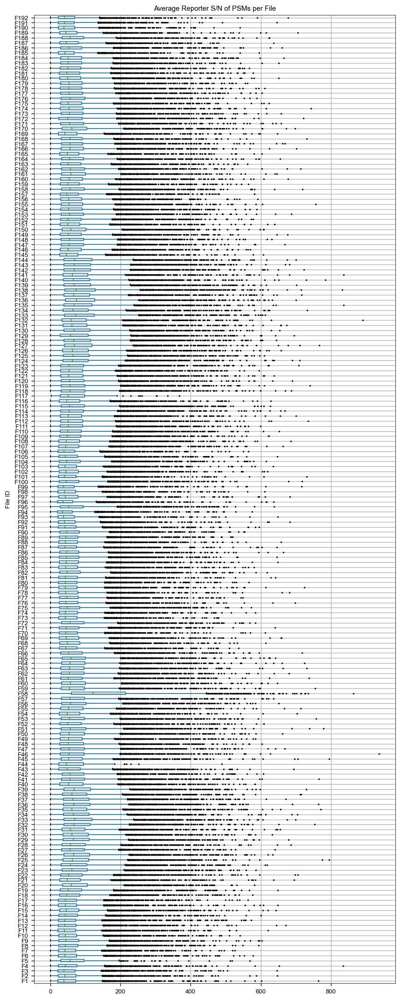

In [8]:
spt.plot_avg_sn(dataset, figsize=(figwd, 18))
plt.savefig(res_dir + "avg_sn.pdf", bbox_inches='tight', transparent=True)

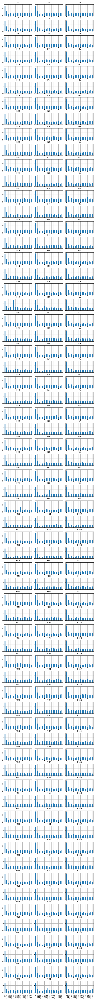

In [9]:
spt.plot_set_overview(dataset, figsize=(figwd, 80))
plt.savefig(res_dir + "set_overview.pdf", bbox_inches='tight', transparent=True)

In [10]:
s_c_channels = ['128N', '128C', '129N', '129C', '130N', '130C', '131N',
                '131C', '132N', '132C', '133N', '133C', '134N']
spt.print_ms_stats(dataset, s_c_channels=s_c_channels)

Protein IDs: 2870
Peptide IDs: 17158
PSMs: 821164
PSM rate: 0.293
Median of median S/N in single-cell channels: 5.7
Median of mean S/N in single-cell channels: 8.955
Median S/N of booster channel: 740.9
Mean protein IDs per file: 1215.469


## Load data into Scanpy

In [11]:
adata = spt.dataset_to_scanpy(dataset)

In [12]:
# transform meta columns to categories
adata.obs["Column"] = adata.obs["Column"].astype(pd.Int64Dtype()).astype("category")
adata.obs["Plate"] = adata.obs["Plate"].astype(str).astype("category")
# object columns to category
adata.obs.loc[:, adata.obs.dtypes == "object"] = adata.obs.select_dtypes(["object"]
                                                                          ).apply(lambda x: x.astype("category"))
# order some columns
adata.obs["File ID"] = adata.obs["File ID"].cat.reorder_categories(adata.obs["File ID"].unique(), ordered=True)
adata.obs["Channel"] = adata.obs["Channel"].cat.reorder_categories(adata.obs["Channel"].unique(), ordered=True)

# normalize facs parameter between 0 and 1
fasc_params = ['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'APC-Cy7-A', 'PE-A']
adata.obs[fasc_params] = adata.obs[fasc_params].apply(lambda x: (x-x.min())/(x-x.min()).max())

# rename the facs parameter
adata.obs = adata.obs.rename(columns={'APC-Cy7-A': 'CD34 APC-Cy7-A', 'PE-A': 'CD38 PE-A'})

# set colors for gated and sorted populations
cols = plt.rcParams['axes.prop_cycle'].by_key()['color']
adata.uns['Sorted Population_colors'] = [cols[0], cols[1], cols[2]]
adata.uns['Gated Population_colors'] = [cols[3], cols[0], cols[1], cols[2]]

## Filter samples, channels and groups of cells

In [13]:
# remove failed ms runs
adata = adata[~adata.obs['File ID'].isin(['F5', 'F44', 'F58', 'F117'])].copy()
# remove non-single-cell cannel
adata = adata[~adata.obs['Channel'].isin(['126', '127C', '127N'])].copy()
adata = adata[~adata.obs['Sorted Population'].isin(['empty'])].copy()

/home/bfurtwa/miniconda3/envs/sceptre_test/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


## Normalization

In [14]:
spt.normalize(adata)

performed 17 iterations
5359 values below 1.1 were set to 0
filtered out 58 genes that are detected in less than 1 cells


## Cell QC

371 of 2396 cells do not pass filter


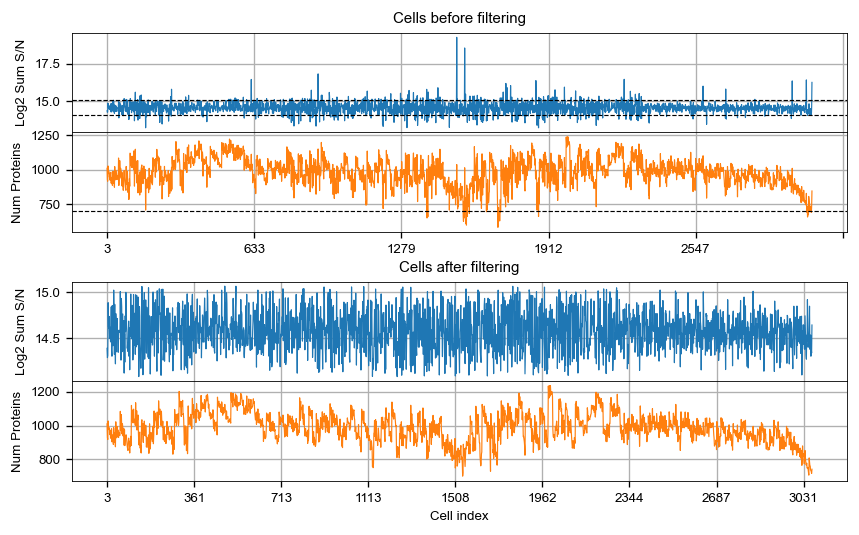

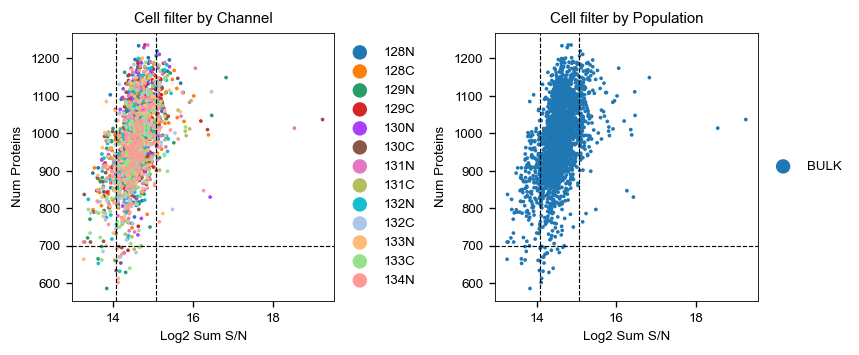

In [15]:
figs = spt.calculate_cell_filter(adata, thresh_sum=1.8, min_proteins=700)
figs[0].savefig(res_dir + "cell_filter_1.pdf", bbox_inches='tight', transparent=True)
figs[1].savefig(res_dir + "cell_filter_2.pdf", bbox_inches='tight', transparent=True)

In [16]:
spt.apply_cell_filter(adata, min_cells=3)

removed 371 cells
filtered out 55 genes that are detected in less than 3 cells


the obs value 'File ID' has more than 103 categories. Uniform 'grey' color will be used for all categories.


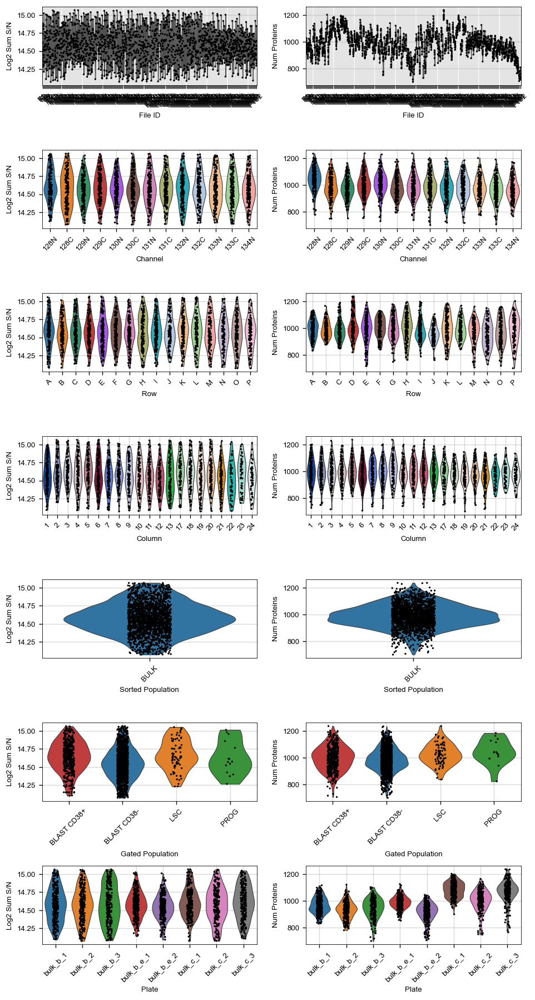

In [17]:
spt.plot_batch_qc(adata)
plt.savefig(res_dir + "batch_qc.pdf", bbox_inches='tight', transparent=True, )

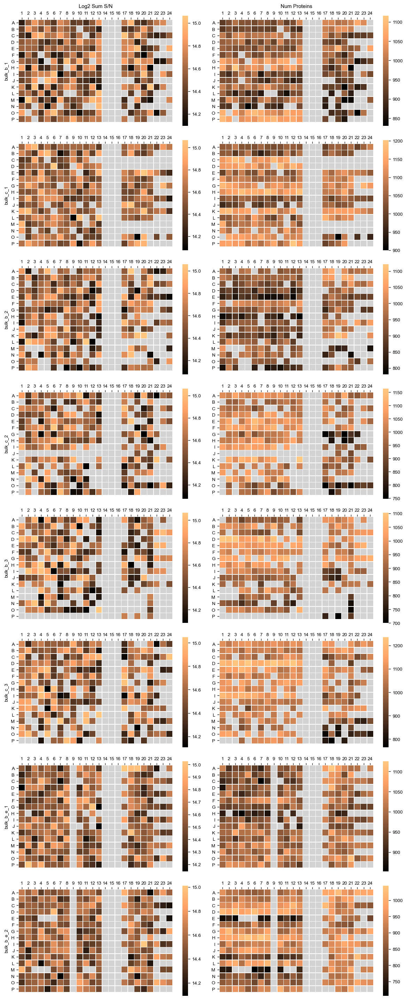

In [18]:
spt.plot_plate_qc(adata, figsize=(10, 24))
plt.savefig(res_dir + "plate_qc.pdf", bbox_inches='tight', transparent=True)

mean protein IDs per cell: 987.0
median protein IDs per cell: 987.0
percent missing values: 63.75


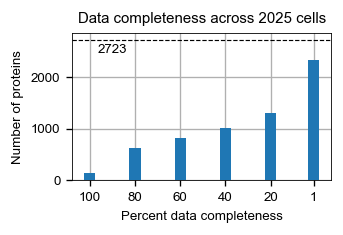

In [19]:
spt.plot_data_completeness(adata)
plt.savefig(res_dir + "data_completeness.pdf", bbox_inches='tight', transparent=True)

BLAST CD38-    1467
BLAST CD38+     467
LSC              76
PROG             15
Name: Gated Population, dtype: int64


/mnt/c/Users/qlj874/OneDrive - Københavns Universitet/Documents/SCeptre/sceptre/sceptre.py:1056: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


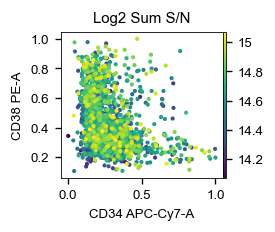

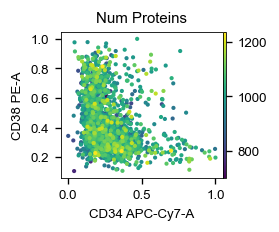

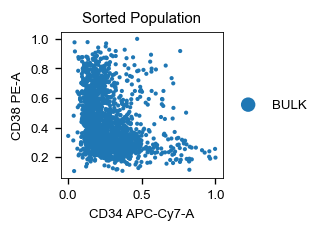

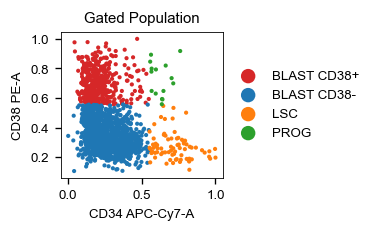

In [20]:
print(adata.obs['Gated Population'].value_counts())
figs = spt.plot_facs_qc(adata, 'CD34 APC-Cy7-A', 'CD38 PE-A')
for i, f in enumerate(figs):
    f.savefig(res_dir + "facs_qc_{}.pdf".format(i), bbox_inches='tight', transparent=True)

## Prepare Embedding

In [21]:
# median shift of total intensity across cells
sc.pp.normalize_total(adata, exclude_highly_expressed=True) 
# log2(x+1) transformation
sc.pp.log1p(adata, base=2)
# save the normalized and log2 transformed data as raw data for differential expression testing
adata.raw = adata

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['NME1-NME2; NME1; NME2', 'S100A8', 'CTSG', 'LYZ', 'S100A9', 'DCD']
    finished (0:00:00)


impute_knn: 1/1
	fraction filter: 1/11
	fraction filter: 2/11
	fraction filter: 3/11
	fraction filter: 4/11
	fraction filter: 5/11
	fraction filter: 6/11
	fraction filter: 7/11
	fraction filter: 8/11
	fraction filter: 9/11
	fraction filter: 10/11
	fraction filter: 11/11


,impute_knn,Fraction of valid values filter,embedding_knn,Silhouette Score
0,5,0.0,30,-0.026104
4,5,0.4,30,-0.031183
1,5,0.1,30,-0.032395
3,5,0.3,30,-0.033170
2,5,0.2,30,-0.034453
5,5,0.5,30,-0.035791
6,5,0.6,30,-0.037555
10,5,1.0,30,-0.038470
7,5,0.7,30,-0.038555
8,5,0.8,30,-0.039318


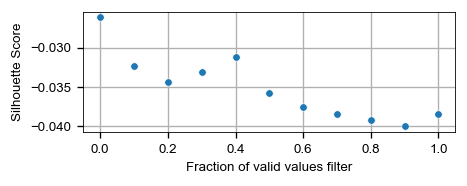

In [22]:
# find the best parameters for the embedding based on celltype separation
# Note that from here on, the code might not be 100% reproducible when changing between computer systems / hardware
# See: https://github.com/theislab/single-cell-tutorial/issues/36#issuecomment-622965632

save_path = '../results/bulk/find_embedding/'
if os.path.exists(save_path):
    shutil.rmtree(save_path)
os.makedirs(save_path)

scores = spt.find_embedding_params(adata, use_rep='umap', labels='Gated Population',
                                   embedding_knn=(30,), save_path=save_path, size=10)
plt.savefig(res_dir + "find_embedding_params.pdf", bbox_inches='tight', transparent=True)
scores

In [23]:
# apply the "fraction of valid values" filter on the proteins
adata = adata[:, (adata.X != 0).sum(axis=0) >= adata.obs.shape[0]*0.0].copy()
# impute for the embedding
spt.impute(adata)
# scale to unit variance and zero mean
sc.pp.scale(adata)
adata

AnnData object with n_obs × n_vars = 2025 × 2723
    obs: 'File ID', 'Channel', 'File Name', 'Plate', 'Sample', 'Row', 'Column', 'Well', 'Sorted Population', 'FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'CD34 APC-Cy7-A', 'CD38 PE-A', 'Time', 'Gated Population', 'Num Proteins', 'Log2 Sum S/N', 'Pass Cell Filter'
    var: 'Accession', 'Description', 'Biological Process', 'Cellular Component', 'Molecular Function', 'KEGG Pathways', 'Reactome Pathways', 'WikiPathways', 'n_cells', 'mean', 'std'
    uns: 'Gated Population_colors', 'Channel_colors', 'Sorted Population_colors', 'File ID_colors', 'Row_colors', 'Column_colors', 'Plate_colors', 'log1p'

In [24]:
plot_parameters = ['Sorted Population', 'Gated Population', 'Channel', 'Plate',
                   'Row', 'Column', 'Num Proteins', 'Log2 Sum S/N', 'Time', 'FSC-A', 'FSC-H',
                   'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'CD34 APC-Cy7-A', 'CD38 PE-A']
# set cmaps for plot parameters
plot_cmaps = {'Num Proteins': 'copper', 'Log2 Sum S/N': 'copper', 'Time': 'copper',
             'FSC-A': 'cividis', 'FSC-H': 'cividis', 'FSC-W': 'cividis', 'SSC-A': 'cividis',
             'SSC-H': 'cividis', 'SSC-W': 'cividis', 'CD34 APC-Cy7-A': 'cividis',
             'CD38 PE-A': 'cividis', 'dpt_pseudotime': 'copper'}

# plotting options for panels
figsize = (10, 16)
wspace = 0.9
hspace = 0.5
cellsize= 10 # size to plot cells

## PCA

In [25]:
sc.pp.pca(adata, random_state=1)

computing PCA
    with n_comps=50
    finished (0:00:06)


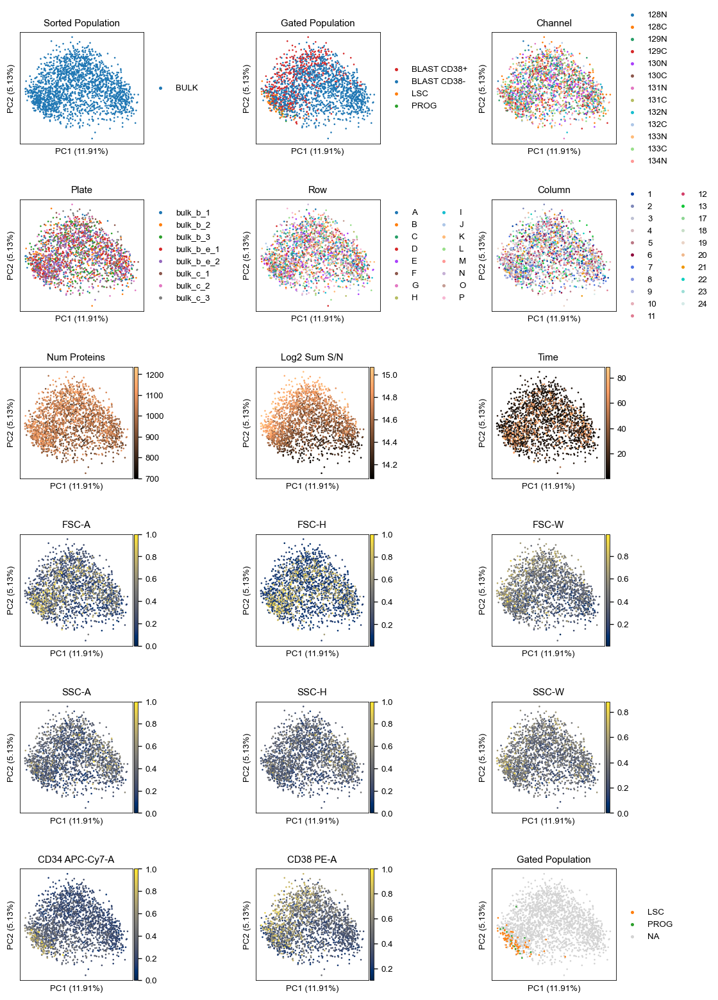

In [26]:
fig = plt.figure(figsize=(10, 16))
for i, p in enumerate(plot_parameters):
    ax = fig.add_subplot(6, 3, i+1)
    cmap = plot_cmaps[p] if p in plot_cmaps else None
    sc.pl.pca(adata, color=p, size=cellsize, cmap=cmap, show=False, ax=ax, annotate_var_explained=True)
plt.subplots_adjust(wspace=0.9, hspace=0.5)
ax = fig.add_subplot(6, 3, i+2)
sc.pl.pca(adata, color=['Gated Population'], groups=['LSC', 'PROG'], size=cellsize, show=False, ax=ax, annotate_var_explained=True)
fig.savefig(res_dir + "pca.pdf", bbox_inches='tight', transparent=True)

## Embedding of the neighborhood graph

In [55]:
sc.pp.neighbors(adata, n_neighbors=30, random_state=5)
sc.tl.umap(adata, random_state=1)
sc.tl.draw_graph(adata, random_state=1)
sc.tl.diffmap(adata)
sc.tl.leiden(adata, resolution=0.3)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:10)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9898217  0.97682637 0.95536584 0.94610566 0.92616653
     0.9174605  0.9088737  0.88841623 0.8786569  0.8771698  0.8653044
     0.8499369  0.8471539  0.8363394 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the clust

In [56]:
# define root cell from diffmap
# the orientation of the diffmap can change randomly. Execute cell 55 and 56 repeatedly to reproduce orientation.
root = adata.obs.index[pd.DataFrame(adata.obsm['X_diffmap']).sort_values(by=[1, 2], ascending=True).index[0]]
adata.obs.loc[:, 'Root Cell'] = 0
adata.obs.loc[root, 'Root Cell'] = 1
adata.uns['iroot'] = np.flatnonzero(adata.obs['Root Cell'] == 1)[0]

# compute pseudotime starting from root cell
sc.tl.dpt(adata)

if 'leiden' not in plot_parameters:
    plot_parameters.append('leiden')
if 'dpt_pseudotime' not in plot_parameters:
    plot_parameters.append('dpt_pseudotime')

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


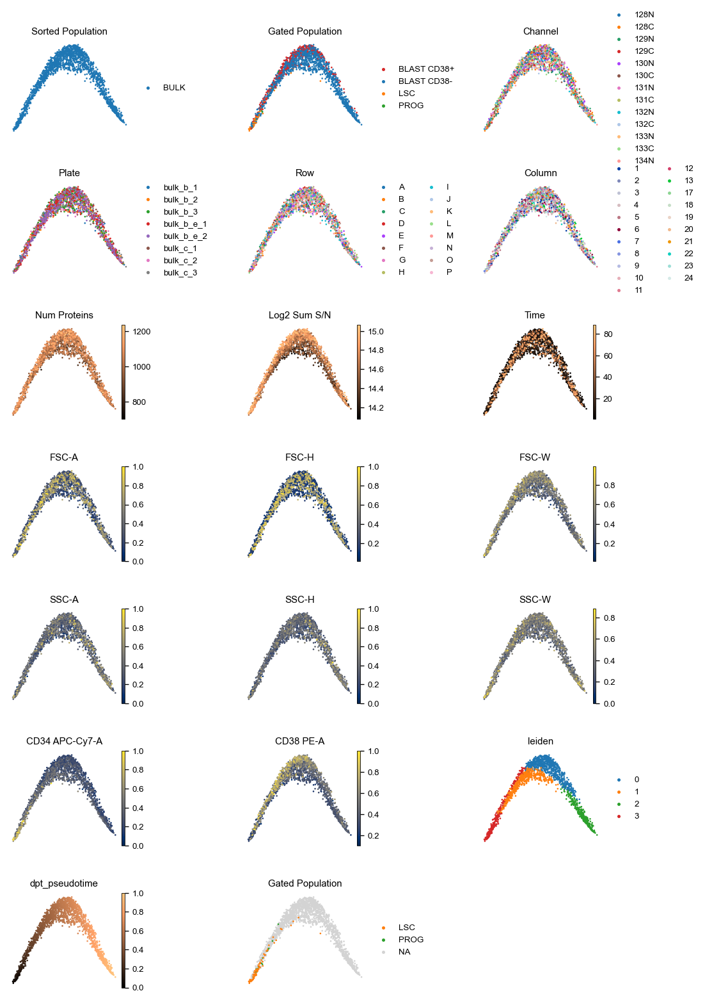

In [57]:
fig = plt.figure(figsize=figsize)
for i, p in enumerate(plot_parameters):
    ax = fig.add_subplot(7, 3, i+1)
    cmap = plot_cmaps[p] if p in plot_cmaps else None
    sc.pl.diffmap(adata, color=p, size=cellsize, cmap=cmap, show=False, ax=ax, frameon=False)
ax = fig.add_subplot(7, 3, i+2)
sc.pl.diffmap(adata, color=['Gated Population'], groups=['LSC', 'PROG'], size=cellsize, show=False, ax=ax, frameon=False)
plt.subplots_adjust(wspace=wspace, hspace=hspace)
fig.savefig(res_dir + "diffmap.pdf", bbox_inches='tight', transparent=True)

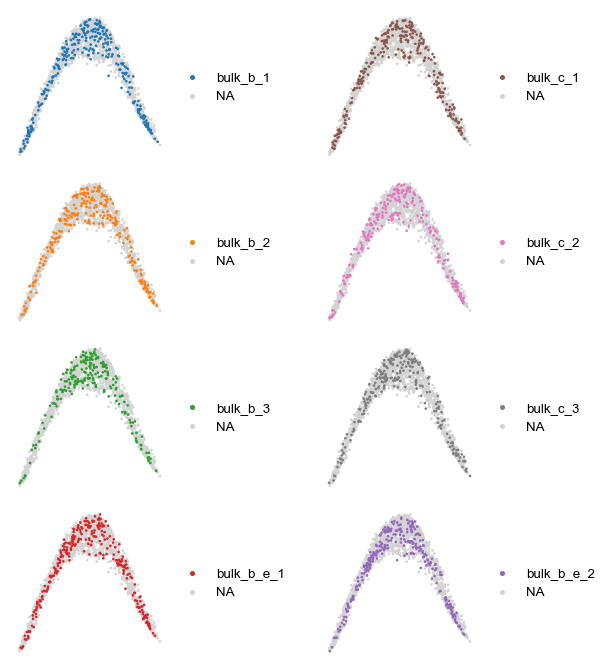

In [58]:
fig, axs = plt.subplots(4, 2, figsize=(5, 7), gridspec_kw={'wspace': 1, 'hspace' :0.1})
axs = axs.flatten()
for i, p in enumerate(adata.obs['Plate'].unique()):
    sc.pl.diffmap(adata, color='Plate', size=cellsize, groups=p, show=False, ax=axs[i],
                  frameon=False, title='')
fig.savefig(res_dir + "plate_integration.pdf", bbox_inches='tight', transparent=True)

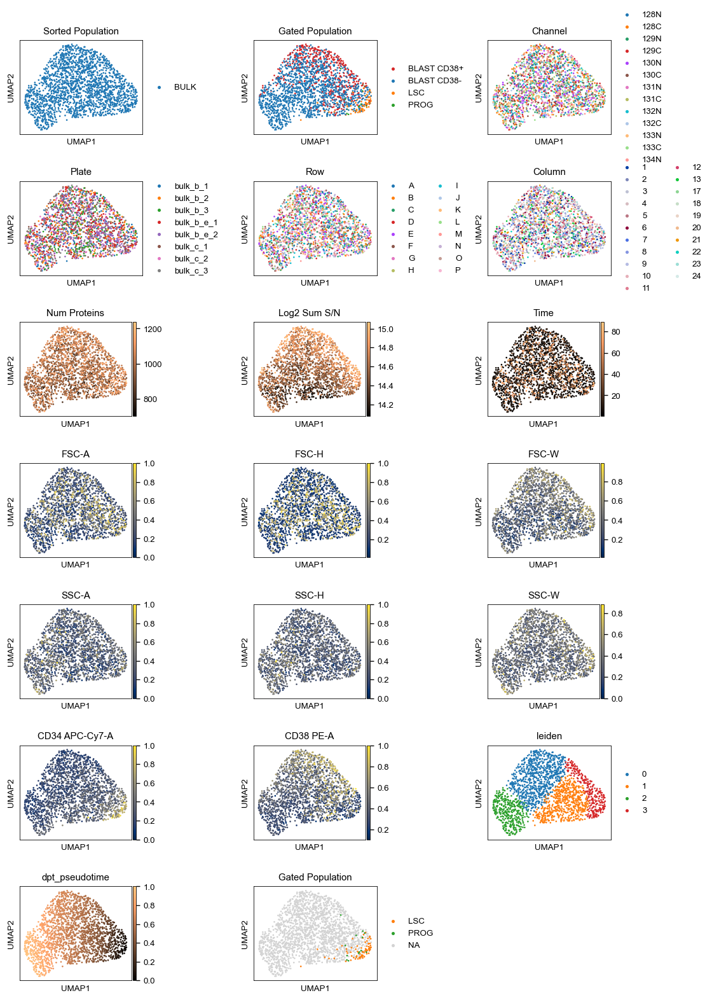

In [59]:
fig = plt.figure(figsize=figsize)
for i, p in enumerate(plot_parameters):
    ax = fig.add_subplot(7, 3, i+1)
    cmap = plot_cmaps[p] if p in plot_cmaps else None
    sc.pl.umap(adata, color=p, size=cellsize, cmap=cmap, show=False, ax=ax)
ax = fig.add_subplot(7, 3, i+2)
sc.pl.umap(adata, color=['Gated Population'], groups=['LSC', 'PROG'], size=cellsize, show=False, ax=ax)
plt.subplots_adjust(wspace=wspace, hspace=hspace)
fig.savefig(res_dir + "umap.pdf", bbox_inches='tight', transparent=True)

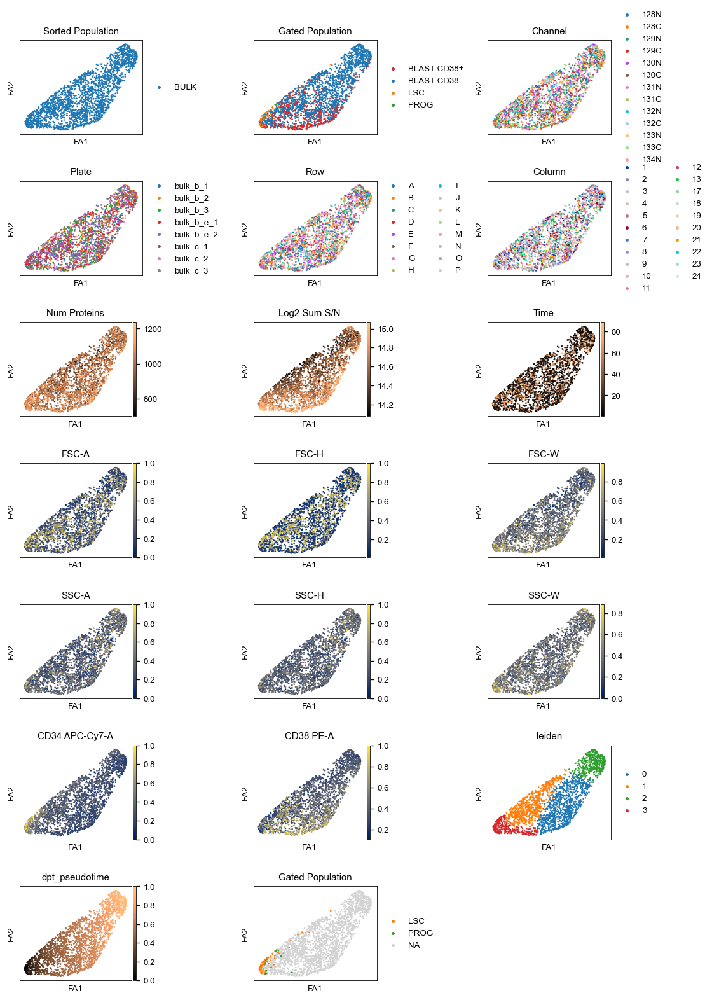

In [60]:
fig = plt.figure(figsize=figsize)
for i, p in enumerate(plot_parameters):
    ax = fig.add_subplot(7, 3, i+1)
    cmap = plot_cmaps[p] if p in plot_cmaps else None
    sc.pl.draw_graph(adata, color=p, size=cellsize, cmap=cmap, show=False, ax=ax)
ax = fig.add_subplot(7, 3, i+2)
sc.pl.draw_graph(adata, color=['Gated Population'], groups=['LSC', 'PROG'], size=cellsize, show=False, ax=ax)
plt.subplots_adjust(wspace=wspace, hspace=hspace)
fig.savefig(res_dir + "fa.pdf", bbox_inches='tight', transparent=True)

In [61]:
# find changing genes
cell_cl = adata.obs['leiden'].unique()
min_cells = 200
log2fc = 0.15
markers = {k:[] for k in cell_cl}
for i in cell_cl:
    spt.de_test(adata, by='leiden', group1=i, key='de_test_{}'.format(i))
    df = adata.uns['de_test_{}'.format(i)]['results']
    df['group'] = i
    markers[i] = df[(df['pval_adj'] <= 0.05) & (df['log2foldchange'] >= log2fc)]
markers = pd.concat(markers.values())
markers = markers.merge(adata.raw.var.loc[markers['gene'], 'n_cells'], how='left', left_on='gene', right_index=True)
markers = markers[markers['n_cells'] >= min_cells]
# remove duplicate genes by keeping it in the group with the highest foldchange
markers = markers.sort_values('log2foldchange', ascending=False).drop_duplicates('gene')

In [62]:
markers

,gene,pval,log2foldchange,size1,size2,pval_adj,group,n_cells
186,S100A8,2.702534e-150,2.687500,360,1663,3.679500e-147,2,2023
281,S100A9,3.613260e-142,2.427034,360,1650,2.459727e-139,2,2010
266,LYZ,6.005158e-159,1.662112,796,1227,4.088011e-156,0,2023
1373,S100A6,2.297023e-92,1.377102,343,1521,2.843088e-90,2,1864
481,ELANE,3.692338e-172,1.276731,785,1155,5.027118e-169,0,1940
...,...,...,...,...,...,...,...,...
100,YARS,1.575780e-12,0.150903,274,1703,1.215538e-11,3,1977
965,RPL14,2.034012e-19,0.150874,569,1400,5.128347e-18,1,1969
2109,MRPL24,1.005082e-03,0.150831,52,236,4.103208e-03,2,288
1874,YTHDF2,6.633397e-03,0.150342,132,361,2.130040e-02,1,493


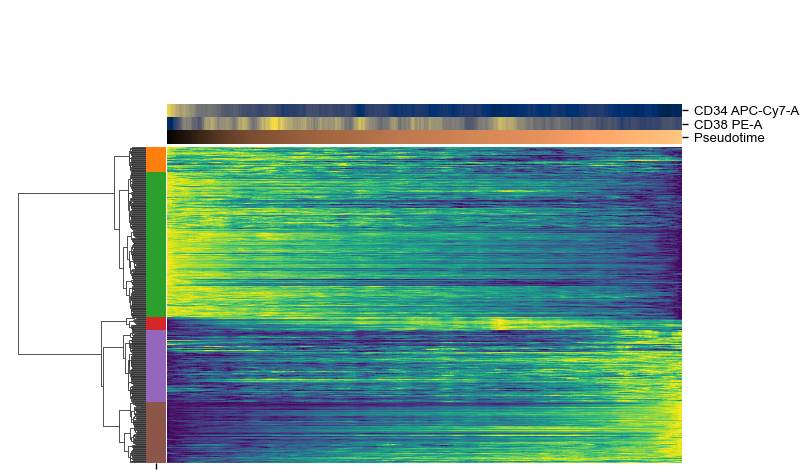

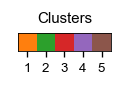

In [63]:
clusters, cl_map, cl_legend = spt.ordered_clustermap(adata, markers['gene'], use_raw=False,
                                                     plot_imputed=True, moving_avg=50, figsize=(6.8, 4),
                                                     show_gene_names=False)
cl_map.savefig(res_dir + 'ordered_clustermap_smooth.pdf', bbox_inches='tight', transparent=True)
cl_legend.savefig(res_dir + 'ordered_clustermap_smooth_legend.pdf', bbox_inches='tight', transparent=True)

In [64]:
markers = markers.merge(clusters)
markers = markers.merge(adata.var[['Accession', 'Description', 'Biological Process', 'Cellular Component',
           'Molecular Function','KEGG Pathways', 'Reactome Pathways', 'WikiPathways']],
              how='left', left_on='gene', right_index=True)
markers = markers.drop(['pval', 'size1', 'size2', 'pval_adj', 'group', 'n_cells'], axis=1)
markers.to_excel(res_dir + 'markers.xls')

In [65]:
# aggregate each cluster into a signature
clus = clusters['cluster'].unique()
from scipy.stats import mstats
for c in clus:
    adata.obs[f'Cluster {c}'] = adata[:, clusters[clusters['cluster']==c]['gene']].X.mean(axis=1)
# normalize
adata.obs[[f'Cluster {c}' for c in clus]] = adata.obs[[f'Cluster {c}' for c in clus]
                                                     ].apply(lambda x: (x-x.min())/(x-x.min()).max())

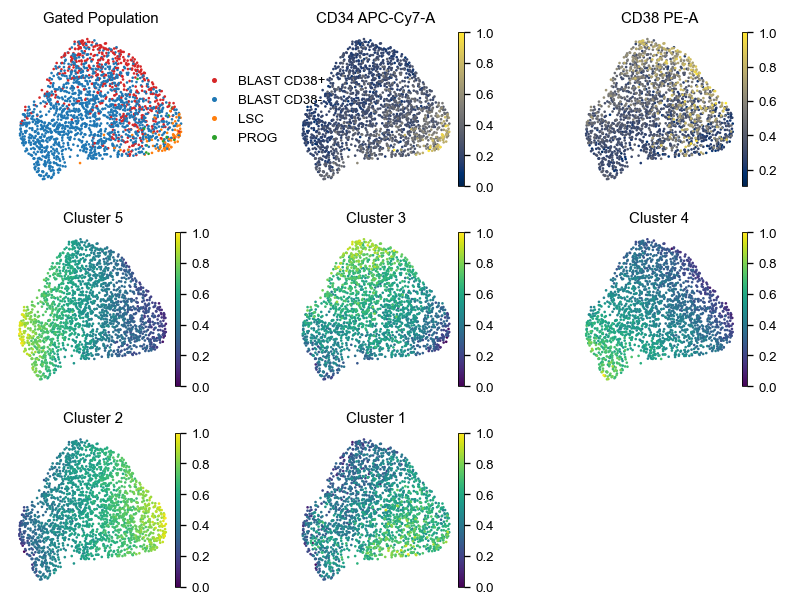

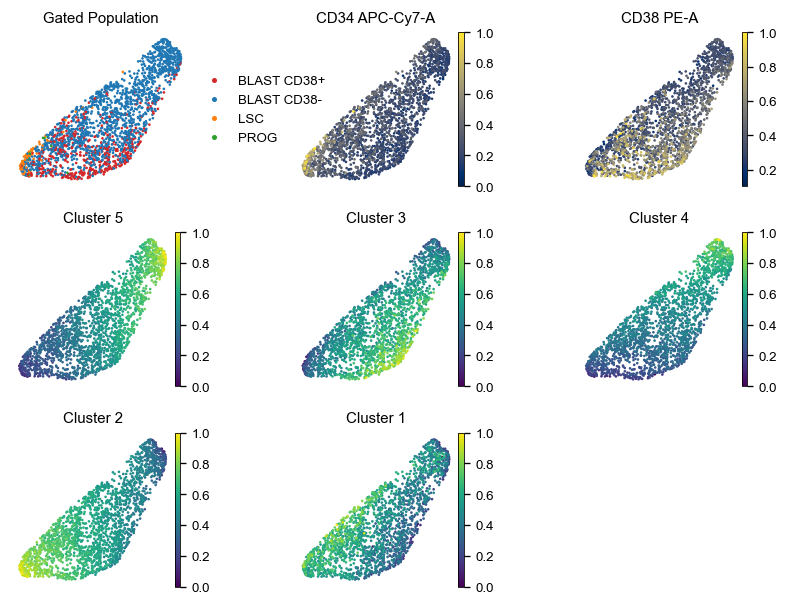

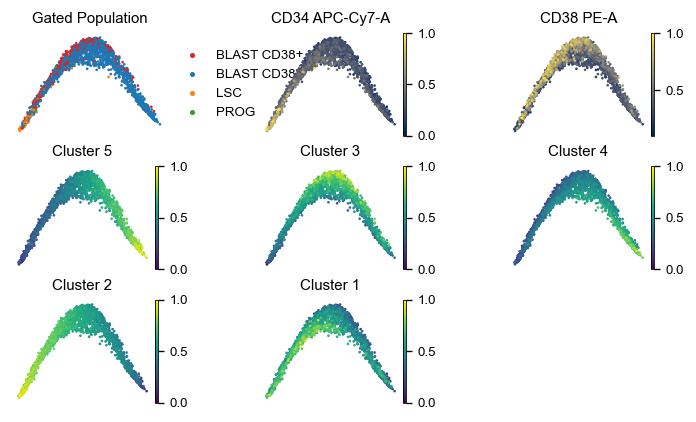

In [66]:
# plot the cluster signature
genes = ['Gated Population', 'CD34 APC-Cy7-A', 'CD38 PE-A'] + [f'Cluster {c}' for c in clusters['cluster'].unique()]
n_row = int((len(genes)/3)+1)

fig = plt.figure(figsize=(8, 6))
for i, p in enumerate(genes):
    ax = fig.add_subplot(n_row, 3, i+1)
    cmap = plot_cmaps[p] if p in plot_cmaps else None
    sc.pl.umap(adata, color=p, size=cellsize, cmap=cmap, show=False, ax=ax, frameon=False)
plt.subplots_adjust(wspace=0.6, hspace=0.3)
fig.savefig(res_dir + "umap_clusters.pdf", bbox_inches='tight', transparent=True)

fig = plt.figure(figsize=(8, 6))
for i, p in enumerate(genes):
    ax = fig.add_subplot(n_row, 3, i+1)
    cmap = plot_cmaps[p] if p in plot_cmaps else None
    sc.pl.draw_graph(adata, color=p, size=cellsize, cmap=cmap, show=False, ax=ax, frameon=False)
plt.subplots_adjust(wspace=0.6, hspace=0.3)
fig.savefig(res_dir + "fa_clusters.pdf", bbox_inches='tight', transparent=True)

fig = plt.figure(figsize=(7, 4))
for i, p in enumerate(genes):
    ax = fig.add_subplot(n_row, 3, i+1)
    cmap = plot_cmaps[p] if p in plot_cmaps else None
    sc.pl.diffmap(adata, color=p, size=cellsize, cmap=cmap, show=False, ax=ax, frameon=False)
plt.subplots_adjust(wspace=0.6, hspace=0.3)
fig.savefig(res_dir + "diffmap_clusters.pdf", bbox_inches='tight', transparent=True)

In [67]:
# term enrichment test
for c in clusters['cluster'].unique():
    spt.enrichment_test(adata, gene_set=clusters[clusters['cluster']==c]['gene'].values,
                        categories=['Biological Process', 'Cellular Component', 'Molecular Function',
                                    'KEGG Pathways', 'Reactome Pathways', 'WikiPathways'],
                        key=f'Cluster {c}')
    adata.uns[f'Cluster {c}'].to_excel(res_dir + "terms_cluster_{}.xls".format(c))

In [68]:
adata.uns[f'Cluster {1}'].head(40)

,size background,# in background,size subset,# in subset,expected,enrichment,pval,pvals_adj,Category
RNA binding,2723.0,790.0,39.0,23.0,11.314726,2.032749,0.000082,0.000905,Molecular Function


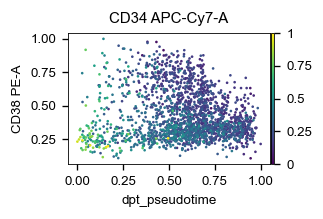

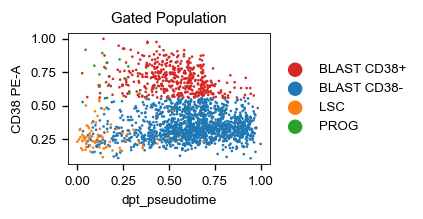

In [69]:
curr = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = (3, 1.5)
sc.pl.scatter(adata, x='dpt_pseudotime', y='CD38 PE-A', color='CD34 APC-Cy7-A', size=10, show=False)
plt.savefig(res_dir + "pseudotime_cd38_cd34.pdf", bbox_inches='tight', transparent=True)
sc.pl.scatter(adata, x='dpt_pseudotime', y='CD38 PE-A', color='Gated Population', size=10, show=False)
plt.savefig(res_dir + "pseudotime_cd38_pop.pdf", bbox_inches='tight', transparent=True)
plt.rcParams["figure.figsize"] = curr

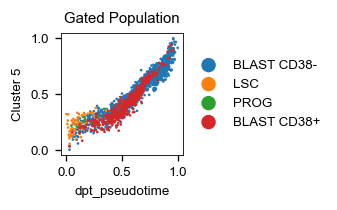

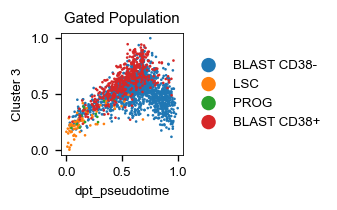

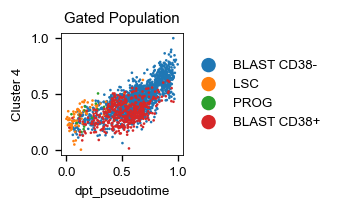

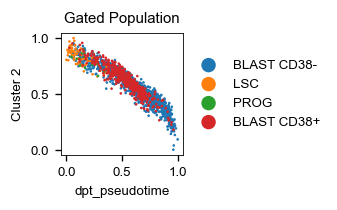

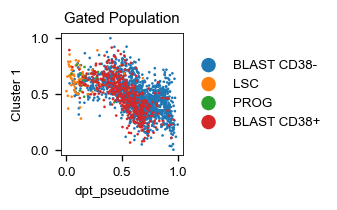

In [70]:
curr = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = (2.4, 1.4)
for c in clusters['cluster'].unique():
    sc.pl.scatter(adata, x='dpt_pseudotime', y=f'Cluster {c}', color='Gated Population',
                  groups=['BLAST CD38-', 'LSC', 'PROG', 'BLAST CD38+'], size=10, alpha=1, show=False)
    plt.savefig(res_dir + f"cluster{c}_pseudotime.pdf", bbox_inches='tight', transparent=True)
plt.rcParams["figure.figsize"] = curr

In [71]:
clusters[clusters['cluster']==3]

,gene,cluster
4,ELANE,3
9,PRTN3,3
16,CST7,3
22,CTSG,3
35,MPO,3
71,SERPINB10,3
95,P4HB,3
98,C19orf10; MYDGF,3
138,SLPI,3
150,CALR,3


In [72]:
genes = ['PRDX1',
         'HAT1',
         'ELANE',
         'CTSG',
         'MPO',
         'AZU1']

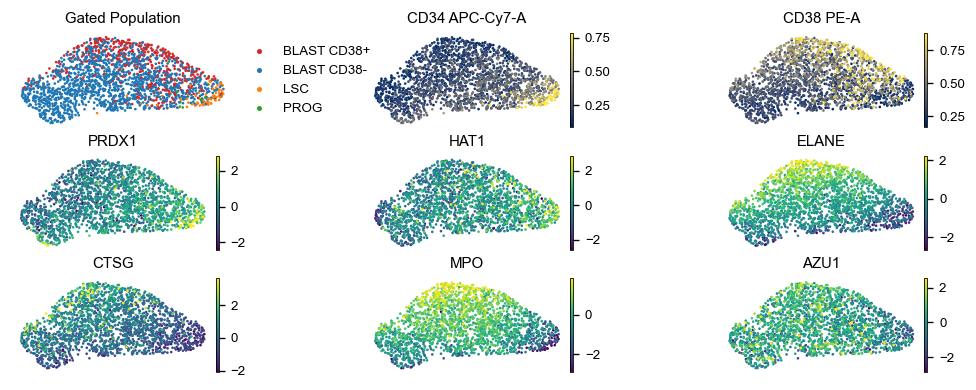

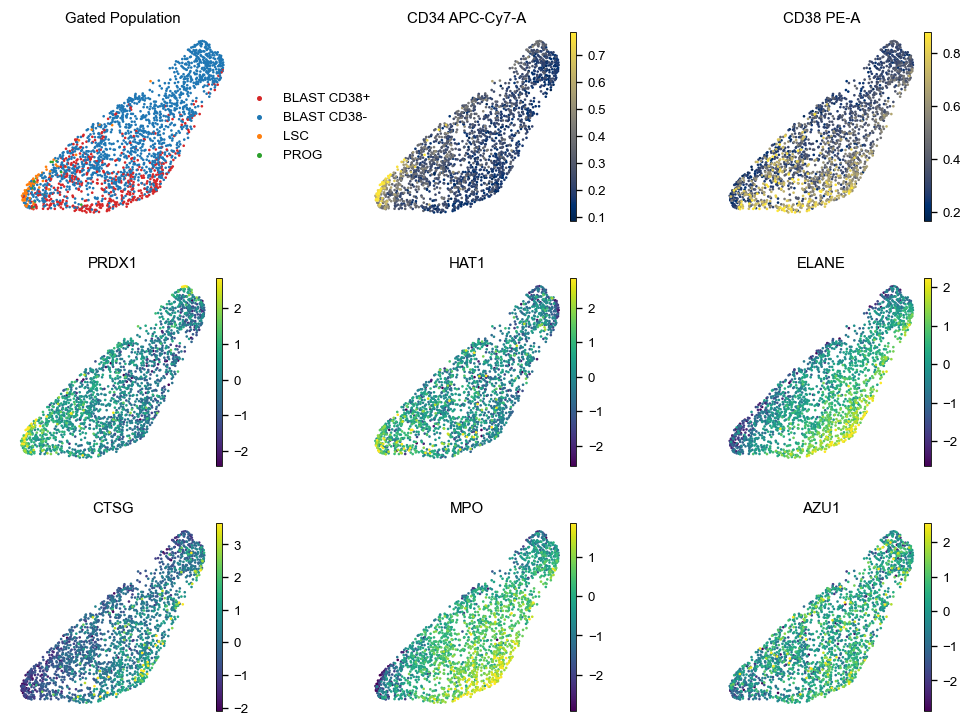

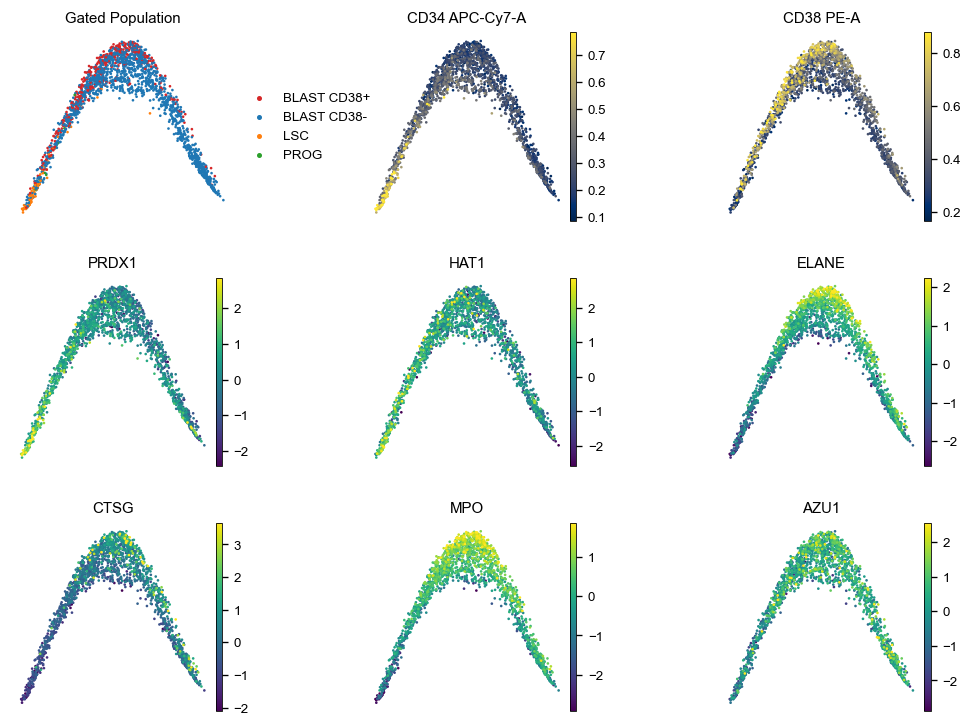

In [73]:
# plot the cluster signature
genes = ['Gated Population', 'CD34 APC-Cy7-A', 'CD38 PE-A'] + genes
n_row = int((len(genes)/3)+1)

v_min = lambda x: np.quantile(x, 0.01)
v_max = lambda x: np.quantile(x, 0.99)

fig = plt.figure(figsize=(10, 5))
for i, p in enumerate(genes):
    ax = fig.add_subplot(n_row, 3, i+1)
    cmap = plot_cmaps[p] if p in plot_cmaps else None
    sc.pl.umap(adata, color=p, size=cellsize, cmap=cmap, use_raw=False, show=False, ax=ax, frameon=False, vmin=v_min, vmax=v_max)
plt.subplots_adjust(wspace=0.6, hspace=0.3)
fig.savefig(res_dir + "umap_genes.pdf", bbox_inches='tight', transparent=True)

fig = plt.figure(figsize=(10, 10))
for i, p in enumerate(genes):
    ax = fig.add_subplot(n_row, 3, i+1)
    cmap = plot_cmaps[p] if p in plot_cmaps else None
    sc.pl.draw_graph(adata, color=p, size=cellsize, cmap=cmap, use_raw=False, show=False, ax=ax, frameon=False, vmin=v_min, vmax=v_max)
plt.subplots_adjust(wspace=0.6, hspace=0.3)
fig.savefig(res_dir + "fa_genes.pdf", bbox_inches='tight', transparent=True)

fig = plt.figure(figsize=(10, 10))
for i, p in enumerate(genes):
    ax = fig.add_subplot(n_row, 3, i+1)
    cmap = plot_cmaps[p] if p in plot_cmaps else None
    sc.pl.diffmap(adata, color=p, size=cellsize, cmap=cmap, use_raw=False, show=False, ax=ax, frameon=False, vmin=v_min, vmax=v_max)
plt.subplots_adjust(wspace=0.6, hspace=0.3)
fig.savefig(res_dir + "diffmap_genes.pdf", bbox_inches='tight', transparent=True)

In [74]:
# save adata
adata.write(res_dir + "bulk.h5ad")

In [75]:
os.system('jupyter nbconvert --to html bulk.ipynb --output-dir={}'.format(res_dir))

0